
# AI6124 Project
Created by A/Prof Kai Keng ANG (kkang@i2r.a-star.edu.sg, kkang@ntu.edu.sg). Last modified 29 Sep 2024

Submitted by: Group 38: Liu Fenghao Mat ID: G2403069A and [Student 2 Name] Mat ID: [Student 2 ID]

# Instructions
Enter your name according to NTU Learn, and your student ID above. Do not include the square brackets. Please save the file as "AI6124\_Project\_Group[Group ID]\_[Student name 1]\_[Student name 2].ipynb" and submit in NTU Learn. Eg. "AI6124\_Project\_Group03\_James\_Tan\_and\_May\_Chua.ipynb"



## Objective

After completing this project, you will know:

Part 1: (Code provided)
* How to download any stock prices to work on
* How to compute buy sell signals on the stock
* How to measure portfolio performance from profit and loss based on buy and sell signals on the stock

Part 2: (To be coded by student)
* How to choose parameters to optimize profits, and explore different trading strategies
* How to apply computational intelligent methods to choose parameters of trading strategies on training data set, then apply to test data set
* How to benchmark the portfolio performance of  computational intelligent methods

Part 3: (To be coded by student)
* How to apply computational intelligent methods to measure the performance of the prediction
* How to train an initial model then perform transfer learning onto another dataset
* How to interpret and explain the computational intelligent method in predicting the stock prices
* How to apply the stock price prediction to help increase profits, and benchmark the portfolio performance with and without prediction

Code for part 1 of first 3 objectives listed above are provide for you to kick start your project. You will have to complete part 2 and part 3 for the project.


## Reference

Ang, K. K., & Quek, C. (2006). Stock Trading Using RSPOP: A Novel Rough Set-Based Neuro-Fuzzy Approach. IEEE Trans. Neural Netw., 17(5), 1301-1315. doi:http://dx.doi.org/10.1109/TNN.2006.875996

## Introduction

First we install the yahoo finance library

This library is used to download stock prices into pandas data frame.

In [1]:
!pip install pandas
!pip install yfinance
!pip install yahoofinancials
!pip install mpld3

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for yahoofinancials: filename=yahoofinancials-1.20-py3-none-any.whl size=38679 sha256=7f1fb24856a59168dcc1bcfb7580c9f1b4a2048f4e3d1d21aaad47c3ea4ed2a4
  Stored in directory: c:\users\36545\appdata\local\pip\cache\wheels\25\35\60\1274e87a2d70c1ff82b130b1c6882fc0588f4e3b63874bb446
Successfully built yahoofinancials


In [2]:
%matplotlib inline

Then we import the necessary libraries

In [3]:
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from yahoofinancials import YahooFinancials
%matplotlib inline
import mpld3
mpld3.enable_notebook()

# 1. Stock prices

Pick a Singapore trust stock price to download. Do not pick just any stocks. An example is Real Estate Investment Trust (REIT). You will need the symbol, such as Keppel REIT (K71U.SI). You can look up the symbol from https://sg.finance.yahoo.com/lookup. The following is how you can download the historical prices of a REIT.

In [5]:
stock_df = yf.download('AAPL')
stock_df.head()

[*********************100%***********************]  1 of 1 completed


Price,Adj Close,Close,High,Low,Open,Volume
Ticker,AAPL,AAPL,AAPL,AAPL,AAPL,AAPL
Date,,,,,,
1980-12-12 00:00:00+00:00,0.098834,0.128348,0.128906,0.128348,0.128348,469033600
1980-12-15 00:00:00+00:00,0.093678,0.121652,0.122210,0.121652,0.122210,175884800
1980-12-16 00:00:00+00:00,0.086802,0.112723,0.113281,0.112723,0.113281,105728000
1980-12-17 00:00:00+00:00,0.088951,0.115513,0.116071,0.115513,0.115513,86441600
1980-12-18 00:00:00+00:00,0.091530,0.118862,0.119420,0.118862,0.118862,73449600


Alternatively, you can also use the ticker function to download the stock price. Ticker also allows you to download additional data. After you downloaded the stock price, you can also plot the data.

<Axes: title={'center': "APPLE's price"}, xlabel='Date'>

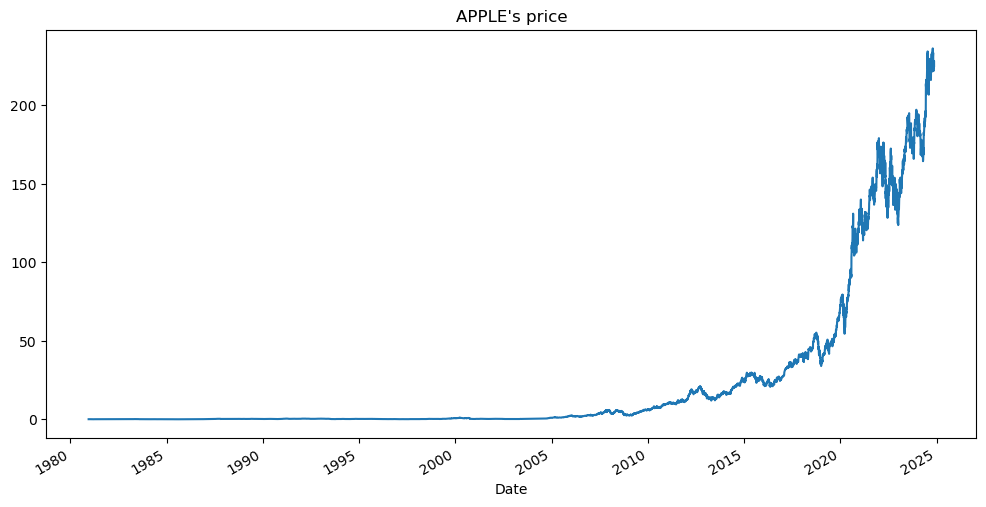

In [6]:
ticker = yf.Ticker('AAPL')
stock_df = ticker.history(period="max")
figure(figsize=(12, 6))
stock_df['Close'].plot(title="APPLE's price")

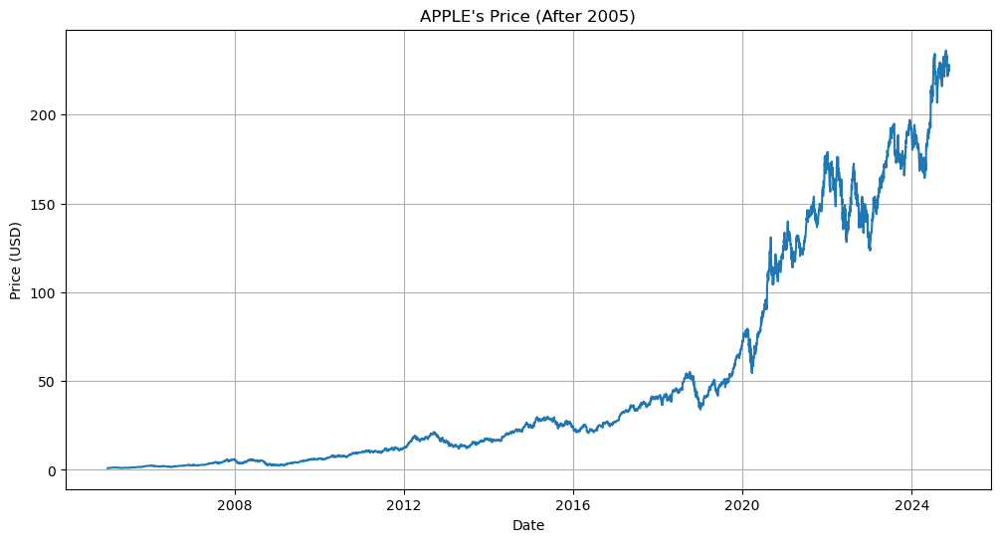

In [7]:
stock_df = stock_df[stock_df.index >= "2005-01-01"]

# Plot the filtered data
plt.figure(figsize=(12, 6))
plt.plot(stock_df['Close'])
plt.title("APPLE's Price (After 2005)")
plt.xlabel("Date")
plt.ylabel("Price (USD)")
plt.grid(True)
plt.show()

In [8]:
stock_df.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2005-01-03 00:00:00-05:00,0.975804,0.980775,0.942965,0.953360,691992000,0.0,0.0
2005-01-04 00:00:00-05:00,0.960890,0.986196,0.948538,0.963150,1096810400,0.0,0.0
2005-01-05 00:00:00-05:00,0.970983,0.982884,0.964807,0.971586,680433600,0.0,0.0
2005-01-06 00:00:00-05:00,0.974146,0.977762,0.953962,0.972339,705555200,0.0,0.0
2005-01-07 00:00:00-05:00,0.979117,1.048861,0.975351,1.043136,2227450400,0.0,0.0


# 2. Computing trade signals

There are different types of moving averages, such as simple moving average, weighted moving average or exponential moving average. The
difference between the types is how the average is computed based on the weight assigned to data points. Simple moving average can be computed by simply taking the mean of the data points. The period to compute the moving average is a parameter. You can have a 200 days simple moving average, a 5 days simple moving average etc. Here' we compute a fast 20 days and slow 100 days moving average on the close price.

In [5]:
#period is a parameter
df=stock_df
# create 20 days simple moving average column
df['Fast_SMA'] = df['Close'].rolling(window = 20, min_periods = 1).mean()
# create 50 days simple moving average column
df['Slow_SMA'] = df['Close'].rolling(window = 100, min_periods = 1).mean()
# display first few rows
df.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Fast_SMA,Slow_SMA
Date,,,,,,,,,
1980-12-12 00:00:00-05:00,0.098834,0.099264,0.098834,0.098834,469033600,0.0,0.0,0.098834,0.098834
1980-12-15 00:00:00-05:00,0.094108,0.094108,0.093678,0.093678,175884800,0.0,0.0,0.096256,0.096256
1980-12-16 00:00:00-05:00,0.087232,0.087232,0.086802,0.086802,105728000,0.0,0.0,0.093105,0.093105
1980-12-17 00:00:00-05:00,0.088951,0.089381,0.088951,0.088951,86441600,0.0,0.0,0.092066,0.092066
1980-12-18 00:00:00-05:00,0.091530,0.091959,0.091530,0.091530,73449600,0.0,0.0,0.091959,0.091959


There many moving average strategies that can be developed to generate trade signals. here we will use a simple moving average crossover strategy based on the SMAs we computed. A moving average can be use to indicate price trends. A crossover occurs when a faster or shorter moving average, such as the 20 days SMA crosses a slower or longer moving average, such as the 100 days SMA. This crossover  point can be used as a  indicator to buy or sell a stock.

First we create a new column ‘Signal’ such that if Fast_SMA is greater than Slow_SMA then set to 1 else set to 0.


In [6]:
df['Signal'] = 0.0
df['Signal'] = np.where(df['Fast_SMA'] > df['Slow_SMA'], 1.0, 0.0)

We now need to generate the buy and sell from the ‘Signal’ values. Crossover happens when the Fast_SMA and the Slow_SMA cross,  the ‘Signal’ changes from 0 to 1, or from 1 to 0. Thus we can just create a ‘Position’ value to indicate a day-to-day difference of the ‘Signal’ column.

‘Position’ = 1 implies that Signal changed from 0 to 1, meaning a faster moving average has crossed a slower moving average. This indicates a bull or up trend in the price and thus this is a buy signal.

‘Position’ = -1 implies that  Signal changed from 1 to 0, meaning a faster moving average has crossed below a slower moving average. This indicates a bear or down trend in the price and thus this is a sell signal.

In [7]:
df['Position'] = df['Signal'].diff()
# Need to set the first row of Position to 0. Otherwise it is nan from diff function.
df['Position'].iloc[0]=0
# display first few rows
df.head()


C:\Users\14544\AppData\Local\Temp\ipykernel_6132\394523951.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Position'].iloc[0]=0


,Open,High,Low,Close,Volume,Dividends,Stock Splits,Fast_SMA,Slow_SMA,Signal,Position
Date,,,,,,,,,,,
1980-12-12 00:00:00-05:00,0.098834,0.099264,0.098834,0.098834,469033600,0.0,0.0,0.098834,0.098834,0.0,0.0
1980-12-15 00:00:00-05:00,0.094108,0.094108,0.093678,0.093678,175884800,0.0,0.0,0.096256,0.096256,0.0,0.0
1980-12-16 00:00:00-05:00,0.087232,0.087232,0.086802,0.086802,105728000,0.0,0.0,0.093105,0.093105,0.0,0.0
1980-12-17 00:00:00-05:00,0.088951,0.089381,0.088951,0.088951,86441600,0.0,0.0,0.092066,0.092066,0.0,0.0
1980-12-18 00:00:00-05:00,0.091530,0.091959,0.091530,0.091530,73449600,0.0,0.0,0.091959,0.091959,0.0,0.0


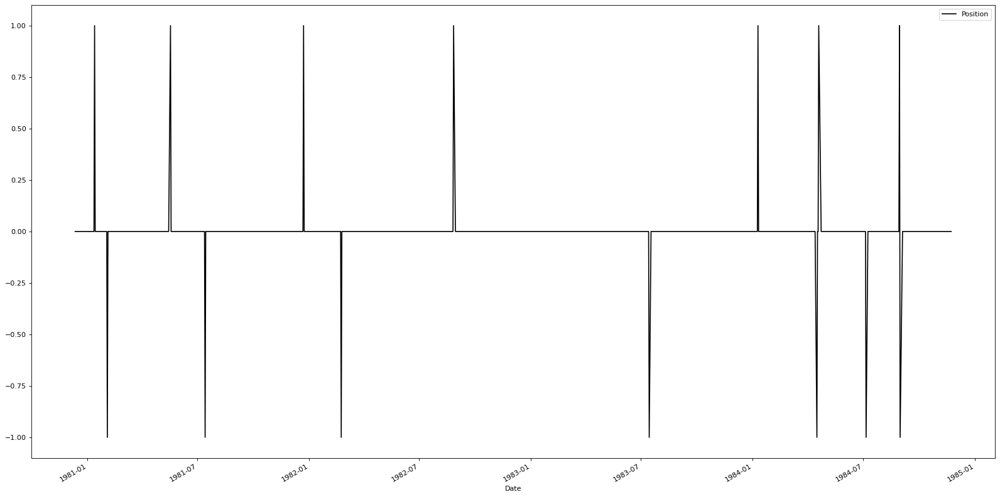

In [8]:
# plt.close('all')
# Plot the positions
plt.figure(figsize = (20,10), dpi=80)
df.iloc[0:1000]['Position'].plot(color = 'k', label= 'Position')
# plt.savefig("position_plot.png", bbox_inches='tight')
plt.legend()
plt.tight_layout()
plt.show()

Next we need to change the position signal to trade signals. Although position can give us this information, we want the change in the trade signal, which is the change from -1 to 1 to indicate a buy, and 1 to -1 to indicate a sell. This is for computing the Multiplicative Portfolio Returns.

0.0


<Axes: xlabel='Date'>

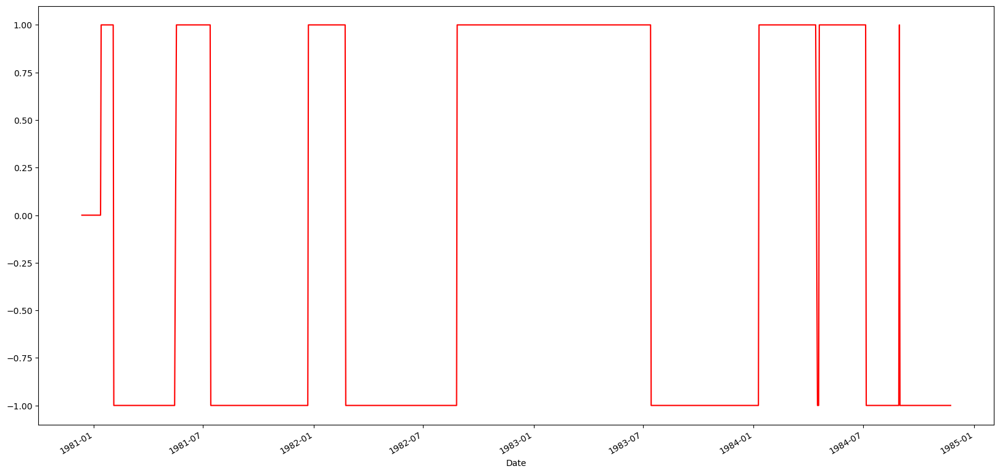

In [9]:
plt.figure(figsize = (20,10))
df['Trade'] = df['Position']
prevrow = df.iloc[0]
print(prevrow['Position'])
for index, row in df.iloc[1:].iterrows():
  if row['Trade']==0:
    if prevrow['Trade']!=0:
      df.at[index,'Trade']=prevrow['Trade']
      row['Trade']=prevrow['Trade']
  prevrow=row
df.iloc[0:1000]['Trade'].plot(color = 'r', label= 'Trade')
# plt.savefig("trade_signal_plot.png", bbox_inches='tight')

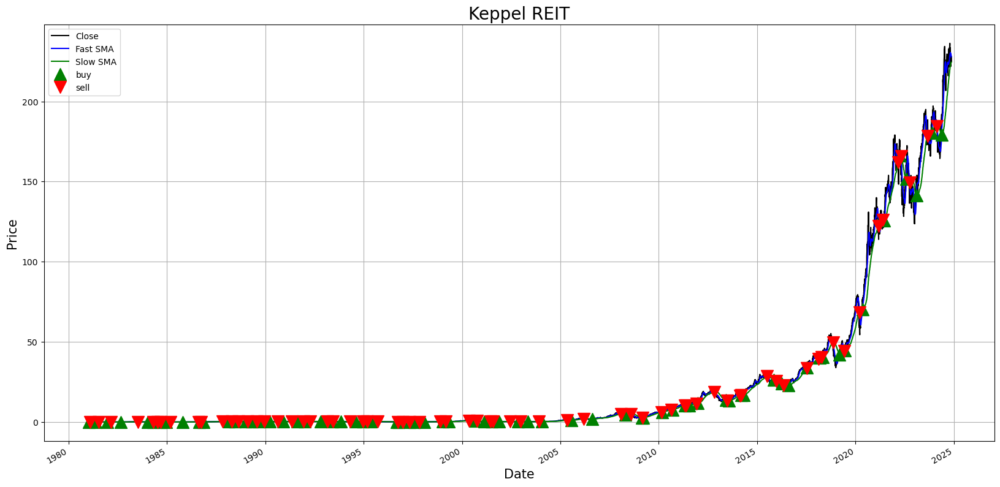

In [10]:
# plot close price, Fast and Slow simple moving averages
def plotprice(df):
  plt.figure(figsize = (20,10))
  df['Close'].plot(color = 'k', label= 'Close')
  df['Fast_SMA'].plot(color = 'b', label = 'Fast SMA')
  df['Slow_SMA'].plot(color = 'g', label = 'Slow SMA')
  # plot buy signals
  plt.plot(df[df['Position'] == 1].index, df['Fast_SMA'][df['Position'] == 1], '^', markersize = 15, color = 'g', label = 'buy')
  # plot sell signals
  plt.plot(df[df['Position'] == -1].index, df['Fast_SMA'][df['Position'] == -1], 'v', markersize = 15, color = 'r', label = 'sell')
  plt.ylabel('Price', fontsize = 15 )
  plt.xlabel('Date', fontsize = 15 )
  plt.title('Keppel REIT', fontsize = 20)
  plt.legend()
  plt.grid()
  # plt.savefig("moving_avg.png", bbox_inches='tight')
  plt.show()

plotprice(df)


It is not very clear in the plot above since it included the prices of many years. Lets zoom in to take a closer look.

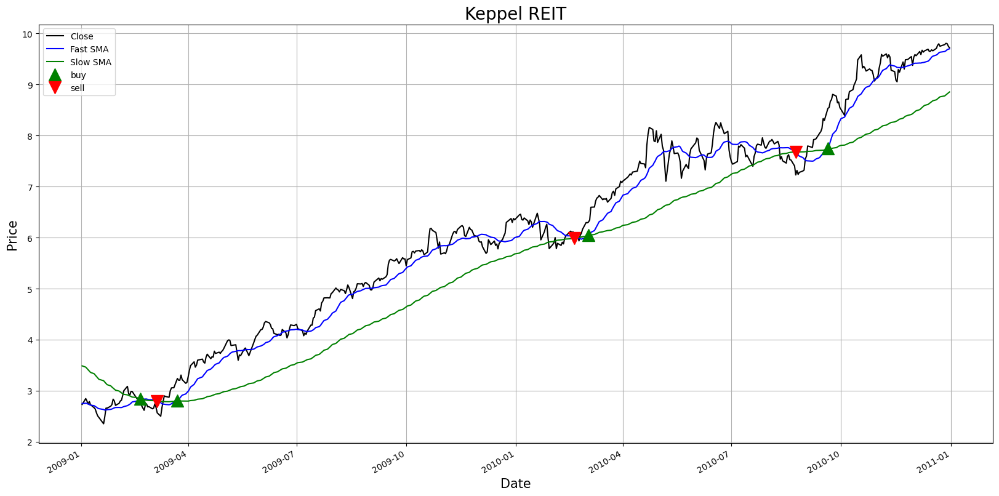

In [11]:
sdf=df.loc['2009-01-01':'2010-12-31']
plotprice(sdf)


Notice that there is a buy at Apr 2009, but the buy and sell are performed at almost the same price at around May 2010. Since each trade incurs a transaction cost, trades at around the same price will result in losses. Hence a better trading strategy can be implemented, such as the introduction of a moving average band to reduce the number of trades around the same price. Refer to the paper on this for more details.

# 3. Computing portfolio returns

The computation of portfolio returns in this section is based on the multiplicative returns given by (refer equation 11 of the reference paper)

$\begin{equation}
R(T)=\{1+F(T-1)r(T)\}\{1-\delta|F(T)-F(T-1)|\}
\end{equation}$

where $r(T)=(y(T)/y(T-1))-1$; $y(T)$ is the closing price at time $T$; $F(T)$ is the action from the trading system; and $\delta$ is the transaction rate.

The multplicative profits $R$ can computed using

$\begin{equation}
R=\prod\limits_{T = 1}^{n} R(T)
\end{equation}$

where $n$ is the total number of time points.


0.0


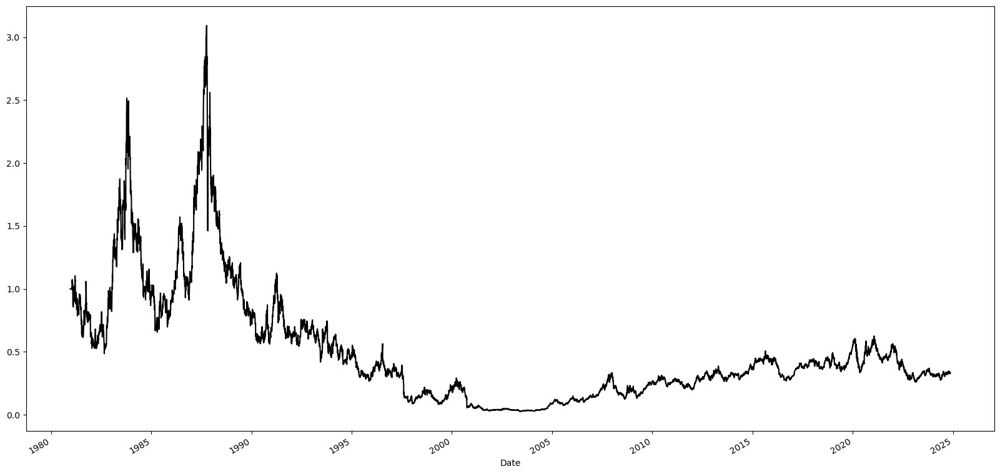

In [12]:
df['Returns']=1.0
print(df.iloc[1]['Trade'])

def computereturns(tdf,trate):
  prevrow = tdf.iloc[0]
  returncol=tdf.columns.get_loc('Returns')
  for i in range(len(tdf)):
    if i==0:
      prev_i=i
    else:
      prevrow=tdf.iloc[prev_i]
      row=tdf.iloc[i]
      rt=(row['Close']/prevrow['Close'])-1
      t=prevrow['Returns']*(1+prevrow['Trade']*rt)*(1-trate*abs(row['Trade']-prevrow['Trade']))
      tdf.iat[i,returncol]=t
      prev_i=i
  return tdf

df=computereturns(df,0.005)
plt.figure(figsize = (20,10))
#df.iloc[1:1000]['Returns'].plot(color = 'k', label= 'Returns')
df['Returns'].plot(color = 'k', label= 'Returns')
plt.savefig("returns_plot.png", bbox_inches='tight')


Notice in the above plot that some times the portfolio returns dropped below 1.0, some times it rises above 1.0 or even as high as 5.0. Hence this shows that the choice of trading strategy and parameters are very important to yield either profits or losses. Above 1.0 indicates there is overall profit. Less than 1.0 indicates there is a loss.


# Part 2:
# 4. choose parameters to optimize profits, and explore different trading strategies

In [13]:
# common used parameter is Moving Average Periods, Thresholds and Stop-Loss and Take-Profit

In [14]:
!pip install deap

In [15]:
import numpy as np
import pandas as pd
from deap import base, creator, tools, algorithms  # For Genetic Algorithm
import matplotlib.pyplot as plt

In [16]:
ticker = yf.Ticker('AAPL')
stock_df1 = ticker.history(period="max")

In [17]:
def calculate_sma(data, window):
    return data['Close'].rolling(window=window).mean()

In [18]:
def compute_signals(data, fast_window, slow_window):
    data['SMA_fast'] = calculate_sma(data, fast_window)
    data['SMA_slow'] = calculate_sma(data, slow_window)
    
    data['Signal'] = 0
    data.loc[data['SMA_fast'] > data['SMA_slow'], 'Signal'] = 1  # Buy
    data.loc[data['SMA_fast'] <= data['SMA_slow'], 'Signal'] = -1  # Sell
    return data

In [19]:
def calculate_pnl(data):
    data['PnL'] = data['Signal'].shift(1) * data['Close'].pct_change()  # Lag the signal
    data['Cumulative_PnL'] = (1 + data['PnL']).cumprod()
    return data


In [20]:
def evaluate_strategy(individual):
    fast_window, slow_window = int(individual[0]), int(individual[1])
    if fast_window >= slow_window or fast_window < 1 or slow_window > 100:
        return -np.inf,  # Penalize invalid configurations
    
    temp_data = compute_signals(stock_df1.copy(), fast_window, slow_window)
    temp_data = calculate_pnl(temp_data)
    final_pnl = temp_data['Cumulative_PnL'].iloc[-1]
    return final_pnl,

In [21]:
creator.create("FitnessMax", base.Fitness, weights=(1.0,))
creator.create("Individual", list, fitness=creator.FitnessMax)

toolbox = base.Toolbox()
toolbox.register("attr_int", np.random.randint, 1, 50)  # Fast and slow SMA ranges
toolbox.register("individual", tools.initRepeat, creator.Individual, toolbox.attr_int, 2)
toolbox.register("population", tools.initRepeat, list, toolbox.individual)

toolbox.register("mate", tools.cxBlend, alpha=0.5)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=5, indpb=0.2)
toolbox.register("select", tools.selTournament, tournsize=3)
toolbox.register("evaluate", evaluate_strategy)

In [22]:
population = toolbox.population(n=50)
NGEN = 50
CXPB, MUTPB = 0.5, 0.2  # Crossover and Mutation probabilities

for gen in range(NGEN):
    offspring = algorithms.varAnd(population, toolbox, CXPB, MUTPB)
    fits = list(map(toolbox.evaluate, offspring))
    for fit, ind in zip(fits, offspring):
        ind.fitness.values = fit
    population = toolbox.select(offspring, k=len(population))

best_individual = tools.selBest(population, k=1)[0]
best_fast, best_slow = best_individual[0], best_individual[1]

print(f"Optimized Fast SMA: {best_fast}, Optimized Slow SMA: {best_slow}")

Optimized Fast SMA: 11.730444612280824, Optimized Slow SMA: 44.63933067367411


C:\Users\14544\AppData\Local\Temp\ipykernel_6132\2729550408.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Position_GA'].iloc[0] = 0  # Set first row to 0


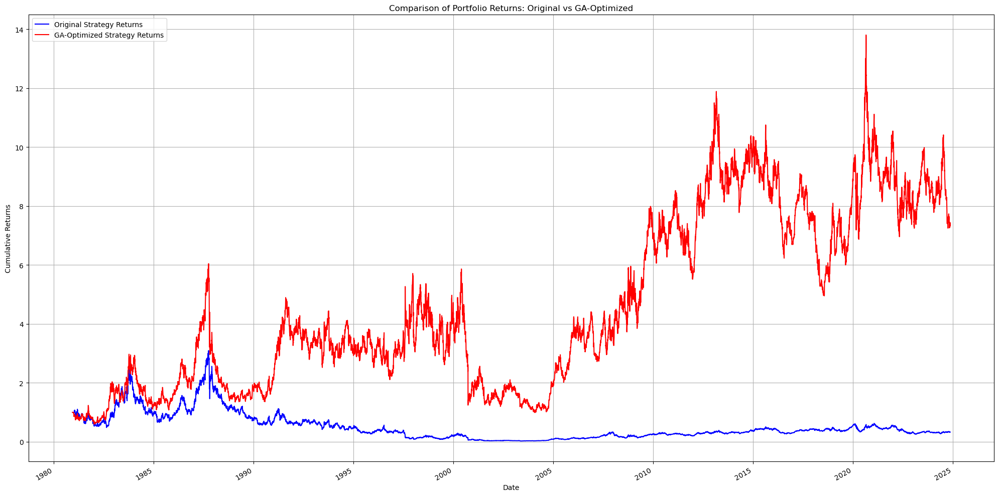

In [23]:
# Apply Optimized Parameters to Compute Returns
df['Fast_SMA_GA'] = df['Close'].rolling(window=int(best_fast), min_periods=1).mean()
df['Slow_SMA_GA'] = df['Close'].rolling(window=int(best_slow), min_periods=1).mean()


# Generate Signals for Optimized Strategy
df['Signal_GA'] = 0.0
df['Signal_GA'] = np.where(df['Fast_SMA_GA'] > df['Slow_SMA_GA'], 1.0, 0.0)
df['Position_GA'] = df['Signal_GA'].diff()
df['Position_GA'].iloc[0] = 0  # Set first row to 0

# Generate Trades for Optimized Strategy
df['Trade_GA'] = df['Position_GA']
prev_row = df.iloc[0]
for index, row in df.iloc[1:].iterrows():
    if row['Trade_GA'] == 0 and prev_row['Trade_GA'] != 0:
        df.at[index, 'Trade_GA'] = prev_row['Trade_GA']
        row['Trade_GA']=prev_row['Trade_GA']
    prev_row = row


# Compute Returns for Optimized Strategy
df['Returns_GA'] = 1.0  # Initialize returns column
def compute_ga_returns(tdf, trate):
    prev_row = tdf.iloc[0]
    return_col = tdf.columns.get_loc('Returns_GA')
    for i in range(len(tdf)):
        if i == 0:
            prev_i = i
        else:
            prev_row = tdf.iloc[prev_i]
            row = tdf.iloc[i]
            rt = (row['Close'] / prev_row['Close']) - 1
            t = prev_row['Returns_GA'] * (1 + prev_row['Trade_GA'] * rt) * (1 - trate * abs(row['Trade_GA'] - prev_row['Trade_GA']))
            tdf.iat[i, return_col] = t
            prev_i = i
    return tdf

df = compute_ga_returns(df, 0.005)

# Plot Comparison of Returns
plt.figure(figsize=(20, 10))
df['Returns'].plot(color='blue', label='Original Strategy Returns')
df['Returns_GA'].plot(color='red', label='GA-Optimized Strategy Returns')
plt.title("Comparison of Portfolio Returns: Original vs GA-Optimized")
plt.xlabel("Date")
plt.ylabel("Cumulative Returns")
plt.legend()
plt.grid()
plt.tight_layout()
plt.savefig("returns_plot.png", bbox_inches='tight')
plt.show()

 # Define some neccessary functions for the portfolio return comparision

In [24]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import yfinance as yf
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error

In [10]:
# predicted price trade signals
def compute_trade_signals_predicted(tdf):
    tdf['FMA'] = tdf['Close'].rolling(window = 20, min_periods = 1).mean()
    tdf['SMA'] = tdf['Close'].rolling(window = 100, min_periods = 1).mean()

    tdf['Signal'] = 0.0
    tdf['Signal'] = np.where(tdf['FMA'] > tdf['SMA'], 1.0, 0.0)

    tdf['Position'] = tdf['Signal'].diff()
    tdf['Position'].iloc[0]=0

    # Trade to tell us when to buy (position from -1 to 1) or sell (position from 1 to -1)
    # Uses T and T+1 
    tdf['Trade'] = tdf['Position']
    for i in range(1,len(tdf)):
        if i != len(tdf)-1:
            if tdf['Trade'].iloc[i] == 0:
                if tdf['Trade'].iloc[i+1] == 0:
                    tdf['Trade'].iloc[i] = tdf['Trade'].iloc[i-1]
                elif tdf['Trade'].iloc[i+1] != 0:
                    tdf['Trade'].iloc[i] = tdf['Trade'].iloc[i+1]
        else:
            tdf['Trade'].iloc[i] = tdf['Trade'].iloc[i-1]

In [11]:
# this is no prediction with same FMA and SMA with the computation for predicted one
def compute_trade_signals(tdf):
    tdf['FMA'] = tdf['Close'].rolling(window = 20, min_periods = 1).mean()
    tdf['SMA'] = tdf['Close'].rolling(window = 100, min_periods = 1).mean()

    tdf['Signal'] = 0.0
    tdf['Signal'] = np.where(tdf['FMA'] > tdf['SMA'], 1.0, 0.0)


    tdf['Position'] = tdf['Signal'].diff()
    tdf['Position'].iloc[0]=0

    # Trade to tell us when to buy (position from -1 to 1) or sell (position from 1 to -1)
    # Uses T and T-1 
    tdf['Trade'] = tdf['Position']
    prevrow = tdf.iloc[0]
    for index, row in tdf.iloc[1:].iterrows():
        if row['Trade']==0:
            if prevrow['Trade']!=0:
                tdf.at[index,'Trade']=prevrow['Trade']
            row['Trade']=prevrow['Trade']
        prevrow=row

In [12]:
def computereturns(tdf,trate):
  tdf['Returns'] = 1.0
  prevrow = tdf.iloc[0]
  returncol=tdf.columns.get_loc('Returns')
  for i in range(len(tdf)):
    if i==0:
      prev_i=i
    else:
      prevrow=tdf.iloc[prev_i]
      row=tdf.iloc[i]
      rt=(row['Close']/prevrow['Close'])-1
      t=prevrow['Returns']*(1+prevrow['Trade']*rt)*(1-trate*abs(row['Trade']-prevrow['Trade']))
      tdf.iat[i,returncol]=t
      prev_i=i
  return tdf

# Data preparation and processing

In [13]:
ticker = yf.Ticker('AAPL')
# ticker = yf.Ticker('MSFT')
stock_df = ticker.history(period="max")
stock_df = stock_df[stock_df.index >= "2005-01-01"]
lookback_window = 25
reference_point_shift = 7
train_ratio=0.7
val_ratio=0.15
# stock_df = stock_df.loc[stock_df.index >= "2005-01-01"]

prices = stock_df['Close'].values
data_length = len(prices)

# Transform into relative prices
relative_prices = []
for t in range(reference_point_shift, data_length - lookback_window):
    ref_price = prices[t - reference_point_shift]  # Reference price
    window_prices = prices[t:t + lookback_window]  # Prices in the current window
    rel_prices = ((window_prices - ref_price) / ref_price)  #* 100  # Relative price transformation
    relative_prices.append(rel_prices)

# Convert to numpy array
relative_prices = np.array(relative_prices)

# Create inputs (X) and targets (y)
X = relative_prices[:, :-1]  # All but the last step in the window as input
y = relative_prices[:, -1]  # Last step in the window as target

# Sequential Split
num_samples = len(X)
train_end = int(train_ratio * num_samples)
val_end = int((train_ratio + val_ratio) * num_samples)

X_train, X_val, X_test = X[:train_end], X[train_end:val_end], X[val_end:]
y_train, y_val, y_test = y[:train_end], y[train_end:val_end], y[val_end:]

# Convert to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
X_val = torch.tensor(X_val, dtype=torch.float32)
X_test = torch.tensor(X_test, dtype=torch.float32)

y_train = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)  # Add output dimension
y_val = torch.tensor(y_val, dtype=torch.float32).unsqueeze(1)
y_test = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)

In [14]:
print("Training Input Shape:", X_train.shape)
print("Validation Input Shape:", X_val.shape)
print("Testing Input Shape:", X_test.shape)
print("Training Target Shape:", y_train.shape)
print("Validation Target Shape:", y_val.shape)
print("Testing Target Shape:", y_test.shape)

Training Input Shape: torch.Size([3479, 24])
Validation Input Shape: torch.Size([746, 24])
Testing Input Shape: torch.Size([746, 24])
Training Target Shape: torch.Size([3479, 1])
Validation Target Shape: torch.Size([746, 1])
Testing Target Shape: torch.Size([746, 1])


# Define and train the Hybrid Fuzzy LSTM model

In [15]:
class ConditionLayer(nn.Module):
    def __init__(self, input_size, num_memberships):
        """
        Initializes the Condition Layer for fuzzification.
        Args:
            input_size (int): Number of input features.
            num_memberships (int): Number of membership functions per feature (e.g., "low", "medium", "high").
        """
        super(ConditionLayer, self).__init__()
        
        self.input_size = input_size
        self.num_memberships = num_memberships
        
        # Parameters for membership functions (learnable)
        self.left_centers = nn.Parameter(torch.rand(input_size, num_memberships))  # Γ_left
        self.right_centers = nn.Parameter(torch.rand(input_size, num_memberships))  # Γ_right
        self.left_widths = nn.Parameter(torch.rand(input_size, num_memberships))  # σ_left
        self.right_widths = nn.Parameter(torch.rand(input_size, num_memberships))  # σ_right
        # self.dic_algorithms = [ModifiedDIC(plasticity, tendency, input_threshold, output_threshold, slope)
        #                        for _ in range(input_size)]

    def forward(self, x):
        """
        Forward pass for the Condition Layer.
        Args:
            x (Tensor): Input tensor of shape (batch_size, input_size).
        Returns:
            Tensor: Membership values of shape (batch_size, input_size * num_memberships).
        """
        batch_size = x.size(0)
        memberships = []

        # Compute membership values for each feature
        for i in range(self.input_size):
            feature = x[:, i:i+1]  # Extract the i-th feature (batch_size, 1)

            # Compute Gaussian membership for left and right regions
            left_membership = torch.exp(
                -((feature - self.left_centers[i])**2) / (2 * self.left_widths[i]**2)
            )  # (batch_size, num_memberships)
            
            right_membership = torch.exp(
                -((feature - self.right_centers[i])**2) / (2 * self.right_widths[i]**2)
            )  # (batch_size, num_memberships)

            # Combine memberships and append
            membership = torch.where(
                (feature >= self.left_centers[i]) & (feature <= self.right_centers[i]),
                torch.ones_like(left_membership),  # Set to 1 if within the range
                torch.max(left_membership, right_membership)  # Take max of left or right
            )
            memberships.append(membership)

        # Concatenate memberships for all features
        memberships = torch.cat(memberships, dim=1)  # (batch_size, input_size * num_memberships)
        return memberships

In [16]:
class HiddenLayer(nn.Module):
    def __init__(self, input_size, lstm_hidden_size, lstm_layers, output_size, num_rules):
        """
        Initializes the Hidden Layer with LSTM and Fuzzy System paths.
        Args:
            input_size (int): Size of the input (membership values).
            lstm_hidden_size (int): Number of hidden units in the LSTM.
            lstm_layers (int): Number of LSTM layers.
            output_size (int): Size of the output from the LSTM path.
            num_rules (int): Number of fuzzy rule nodes in the fuzzy system.
        """
        super(HiddenLayer, self).__init__()
        
        # LSTM path
        self.lstm = nn.LSTM(input_size, lstm_hidden_size, lstm_layers, batch_first=True)
        self.lstm_to_output = nn.Linear(lstm_hidden_size, output_size)

        # Fuzzy System path
        self.rule_weights = nn.Parameter(torch.rand(num_rules, input_size))
        self.rule_bias = nn.Parameter(torch.rand(num_rules))

    def forward(self, x):
        """
        Forward pass for the Hidden Layer.
        Args:
            x (Tensor): Input tensor of shape (batch_size, sequence_length, input_size).
        Returns:
            Tensor: Combined output from LSTM and fuzzy system paths.
        """
        # LSTM path
        lstm_out, _ = self.lstm(x)  # Output shape: (batch_size, sequence_length, lstm_hidden_size)
        lstm_out = self.lstm_to_output(lstm_out[:, -1, :])  # Take last time step, shape: (batch_size, output_size)
        
        # Fuzzy System path
        fuzzy_out = torch.matmul(x.mean(dim=1), self.rule_weights.T) + self.rule_bias
        fuzzy_out = torch.tanh(fuzzy_out)  # Apply activation function for fuzzy output

        # Combine outputs
        combined_out = torch.cat([lstm_out, fuzzy_out], dim=1)  # Concatenate along the feature dimension
        return combined_out

In [17]:
class ConsequenceLayer(nn.Module):
    def __init__(self, input_size, output_size):
        """
        Initializes the Consequence Layer for defuzzification.
        Args:
            input_size (int): Size of the input from the hidden layer.
            output_size (int): Number of output features (e.g., final predictions).
        """
        super(ConsequenceLayer, self).__init__()
        
        # Parameters for membership functions
        self.left_centers = nn.Parameter(torch.rand(output_size))  # Left centers (Γ_left)
        self.right_centers = nn.Parameter(torch.rand(output_size))  # Right centers (Γ_right)
        self.left_widths = nn.Parameter(torch.rand(output_size))  # Left widths (σ_left)
        self.right_widths = nn.Parameter(torch.rand(output_size))  # Right widths (σ_right)

        # Weighting layer for aggregation
        self.weights = nn.Linear(input_size, output_size)

    def forward(self, x):
        """
        Forward pass for the Consequence Layer.
        Args:
            x (Tensor): Input tensor of shape (batch_size, input_size).
        Returns:
            Tensor: Defuzzified crisp output of shape (batch_size, output_size).
        """
        # Weighted aggregation of inputs
        weighted_input = self.weights(x)  # Shape: (batch_size, output_size)

        # Calculate membership values for the left and right regions
        left_membership = torch.exp(
            -((weighted_input - self.left_centers)**2) / (2 * self.left_widths**2)
        )
        right_membership = torch.exp(
            -((weighted_input - self.right_centers)**2) / (2 * self.right_widths**2)
        )

        # Combine memberships using center-of-area (COA) defuzzification
        numerator = self.left_centers * left_membership + self.right_centers * right_membership
        denominator = left_membership + right_membership + 1e-8  # Avoid division by zero
        crisp_output = numerator / denominator

        return crisp_output

In [18]:
class FELSTMModel(nn.Module):
    def __init__(self, input_size, num_memberships, lstm_hidden_size, lstm_layers, hidden_output_size, num_rules, output_size):
        """
        Initializes the full FE-LSTM model.
        Args:
            input_size (int): Number of input features.
            num_memberships (int): Number of membership functions per feature (fuzzy labels).
            lstm_hidden_size (int): Number of hidden units in the LSTM.
            lstm_layers (int): Number of LSTM layers.
            hidden_output_size (int): Output size of the hidden layer.
            num_rules (int): Number of fuzzy rule nodes.
            output_size (int): Final output size (number of predictions).
        """
        super(FELSTMModel, self).__init__()
        
        # Layers
        self.input_layer = nn.Linear(input_size, input_size)
        self.condition_layer = ConditionLayer(input_size, num_memberships)
        self.hidden_layer = HiddenLayer(input_size * num_memberships, lstm_hidden_size, lstm_layers, hidden_output_size, num_rules)
        self.consequence_layer = ConsequenceLayer(hidden_output_size + num_rules, output_size)

    def forward(self, x):
        """
        Forward pass for the FE-LSTM model.
        Args:
            x (Tensor): Input tensor of shape (batch_size, input_size).
        Returns:
            Tensor: Final output of the model.
        """
        # Input Layer
        x = self.input_layer(x)

        # Condition Layer
        memberships = self.condition_layer(x)  # (batch_size, input_size * num_memberships)

        # Hidden Layer
        memberships = memberships.unsqueeze(1)  # Add sequence length dimension for LSTM
        hidden_out = self.hidden_layer(memberships)  # (batch_size, hidden_output_size + num_rules)

        # Consequence Layer
        output = self.consequence_layer(hidden_out)  # (batch_size, output_size)
        
        return output

In [19]:
model = FELSTMModel(
    input_size=24,                # Input features
    num_memberships=3,           # Membership functions per feature
    lstm_hidden_size=16,         # Hidden units in LSTM
    lstm_layers=2,               # LSTM layers
    hidden_output_size=8,        # Hidden layer output size
    num_rules=5,                 # Fuzzy rule nodes
    output_size=1                # Final output size
)
# criterion = nn.MSELoss()
# optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=1e-5)

In [20]:
def train_model(model, X_train, y_train, X_val, y_val, epochs=50, batch_size=32, learning_rate=0.001):
    """
    Trains the FE-LSTM model.
    Args:
        model (nn.Module): The FE-LSTM model.
        X_train (Tensor): Training inputs.
        y_train (Tensor): Training targets.
        X_val (Tensor): Validation inputs.
        y_val (Tensor): Validation targets.
        epochs (int): Number of training epochs.
        batch_size (int): Batch size for training.
        learning_rate (float): Learning rate for optimizer.
    Returns:
        nn.Module: Trained model.
    """
    # Define optimizer and loss function
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.MSELoss()

    # Training loop
    for epoch in range(epochs):
        model.train()
        total_loss = 0

        # Mini-batch training
        for i in range(0, len(X_train), batch_size):
            X_batch = X_train[i:i+batch_size]
            y_batch = y_train[i:i+batch_size]

            # Zero the gradients
            optimizer.zero_grad()

            # Forward pass
            predictions = model(X_batch)

            # Compute loss
            loss = criterion(predictions, y_batch)

            # Backward pass and optimization
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        # Validation
        model.eval()
        with torch.no_grad():
            val_predictions = model(X_val)
            val_loss = criterion(val_predictions, y_val).item()

        print(f"Epoch {epoch+1}/{epochs} - Loss: {total_loss/len(X_train):.6f}, Val Loss: {val_loss:.6f}")

    return model

In [21]:
def predict(model, X_test):
    """
    Predicts using the trained FE-LSTM model.
    Args:
        model (nn.Module): Trained FE-LSTM model.
        X_test (Tensor): Test inputs.
    Returns:
        np.ndarray: Predicted outputs.
    """
    model.eval()
    with torch.no_grad():
        predictions = model(X_test)
    return predictions.numpy()

In [22]:
trained_model = train_model(
    model,
    X_train,
    y_train,
    X_val,
    y_val,
    epochs=100,
    batch_size=32,
    learning_rate=0.001
)

Epoch 1/100 - Loss: 0.001743, Val Loss: 0.014864
Epoch 2/100 - Loss: 0.000455, Val Loss: 0.013610
Epoch 3/100 - Loss: 0.000294, Val Loss: 0.003959
Epoch 4/100 - Loss: 0.000127, Val Loss: 0.002201
Epoch 5/100 - Loss: 0.000085, Val Loss: 0.001622
Epoch 6/100 - Loss: 0.000068, Val Loss: 0.001325
Epoch 7/100 - Loss: 0.000059, Val Loss: 0.001153
Epoch 8/100 - Loss: 0.000053, Val Loss: 0.001022
Epoch 9/100 - Loss: 0.000048, Val Loss: 0.000911
Epoch 10/100 - Loss: 0.000044, Val Loss: 0.000818
Epoch 11/100 - Loss: 0.000040, Val Loss: 0.000740
Epoch 12/100 - Loss: 0.000037, Val Loss: 0.000680
Epoch 13/100 - Loss: 0.000035, Val Loss: 0.000635
Epoch 14/100 - Loss: 0.000033, Val Loss: 0.000605
Epoch 15/100 - Loss: 0.000032, Val Loss: 0.000582
Epoch 16/100 - Loss: 0.000031, Val Loss: 0.000562
Epoch 17/100 - Loss: 0.000030, Val Loss: 0.000544
Epoch 18/100 - Loss: 0.000028, Val Loss: 0.000527
Epoch 19/100 - Loss: 0.000027, Val Loss: 0.000515
Epoch 20/100 - Loss: 0.000026, Val Loss: 0.000506
Epoch 21/

In [25]:
test_predictions = predict(trained_model, X_test)

# Calculate RMSE for the test set
test_rmse = mean_squared_error(y_test.numpy(), test_predictions, squared=False)
print(f"Test RMSE: {test_rmse:.4f}")

# Display the predicted prices
print("Test Predicted Prices:", test_predictions[:10])

Test RMSE: 0.0178
Test Predicted Prices: [[0.08999377]
 [0.10337695]
 [0.12871443]
 [0.10732895]
 [0.09889612]
 [0.08504234]
 [0.11041816]
 [0.15290153]
 [0.17101507]
 [0.1701606 ]]


In [26]:
def transform_to_actual_prices(relative_predictions, reference_prices):
    """
    Transforms relative predictions back to actual prices.
    Args:
        relative_predictions (np.ndarray): Predicted relative values (output of the model).
        reference_prices (np.ndarray): Reference prices corresponding to the test windows.
    Returns:
        np.ndarray: Actual predicted prices.
    """
    return reference_prices * (1 + relative_predictions) # / 100)

In [27]:
test_predictions = predict(trained_model, X_test)
# test_predictions = scaler_y.inverse_transform(test_predictions)

test_reference_prices = stock_df['Close'].iloc[-len(y_test) - 24 - 7: - 24 - 7].values
actual_predicted_prices = transform_to_actual_prices(test_predictions.squeeze(), test_reference_prices)

In [28]:
actual_actual_prices = transform_to_actual_prices(y_test.numpy().flatten(), test_reference_prices)

In [29]:
actual_prices = np.reshape(stock_df['Close'].iloc[-len(y_test) - 1: -1].values, [-1,1])

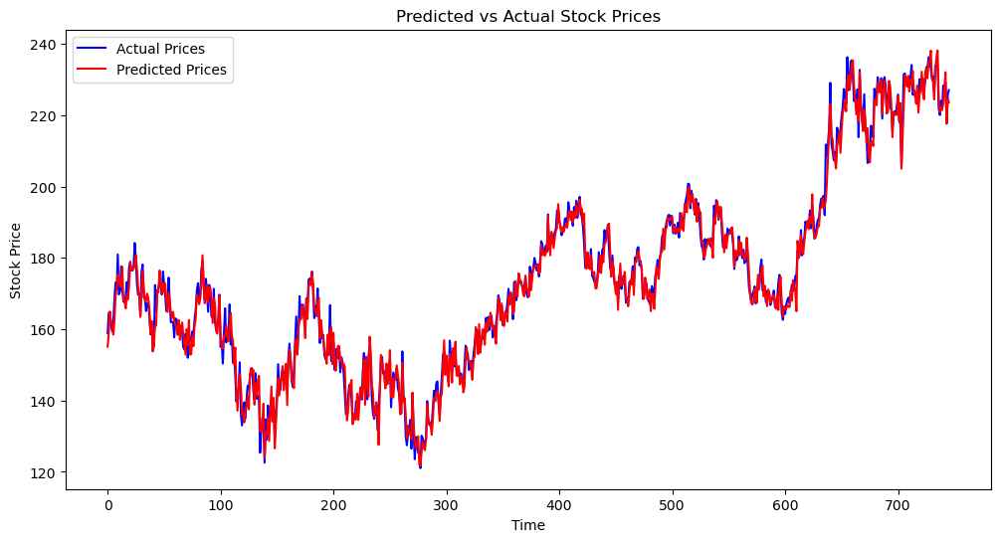

In [30]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(actual_actual_prices, label="Actual Prices", color='blue')
plt.plot(actual_predicted_prices, label="Predicted Prices", color='red')
plt.title("Predicted vs Actual Stock Prices")
plt.xlabel("Time")
plt.ylabel("Stock Price")
plt.legend()
plt.show()

In [31]:
x = np.reshape(actual_actual_prices, [-1, 1])
px = np.reshape(actual_predicted_prices, [-1, 1])

In [83]:
# print(x, px)

In [33]:
mse = ((px-x)**2).mean()
rmse = np.sqrt(mse)
print("RMSE:", rmse)

RMSE: 2.958603558750955


In [34]:
rw_x = np.reshape(stock_df['Close'].iloc[-len(y_test):].values, [-1,1])

In [35]:
mse = ((rw_x-x)**2).mean()
rmse = np.sqrt(mse)
print("RMSE:", rmse)

RMSE: 4.128732326355347


# Plot the portfolio return

In [50]:
train_predictions = predict(trained_model, X_train)
val_predictions = predict(trained_model, X_val)

train_reference_prices = stock_df['Close'].iloc[:train_end].values
val_referece_prices = stock_df['Close'].iloc[train_end:val_end].values

actual_train_predicted_prices = transform_to_actual_prices(train_predictions.squeeze(), train_reference_prices)
actual_val_predicted_prices = transform_to_actual_prices(val_predictions.squeeze(), val_referece_prices)

In [51]:
actual_train_prices = transform_to_actual_prices(y_train.numpy().flatten(), train_reference_prices)
actual_val_prices = transform_to_actual_prices(y_val.numpy().flatten(), val_referece_prices)

In [52]:
predicted = np.concatenate((actual_train_predicted_prices, actual_val_predicted_prices, actual_predicted_prices))
actual = np.concatenate((actual_train_prices, actual_val_prices, actual_actual_prices))

In [39]:
predicted = actual_predicted_prices
actual = actual_actual_prices

In [53]:
index_labels = stock_df.index.array[:len(predicted)]
df_pred = pd.DataFrame(predicted, index=index_labels, columns=['Close'])

In [54]:
df_actual = pd.DataFrame(actual, index=index_labels, columns=['Close'])

In [55]:
compute_trade_signals_predicted(df_pred)

In [56]:
# compute_trade_signals(df_pred)

In [57]:
compute_trade_signals(df_actual)

In [58]:
df_pred = computereturns(df_pred,0.005)
df_actual = computereturns(df_actual,0.005)

In [59]:
# df_actual_1 = pd.DataFrame(actual, index=index_labels, columns=['Close'])

In [60]:
# compute_trade_signals_predicted(df_actual_1)

In [61]:
# df_pred = computereturns(df_actual_1,0.005)
# df_actual = computereturns(df_actual,0.005)

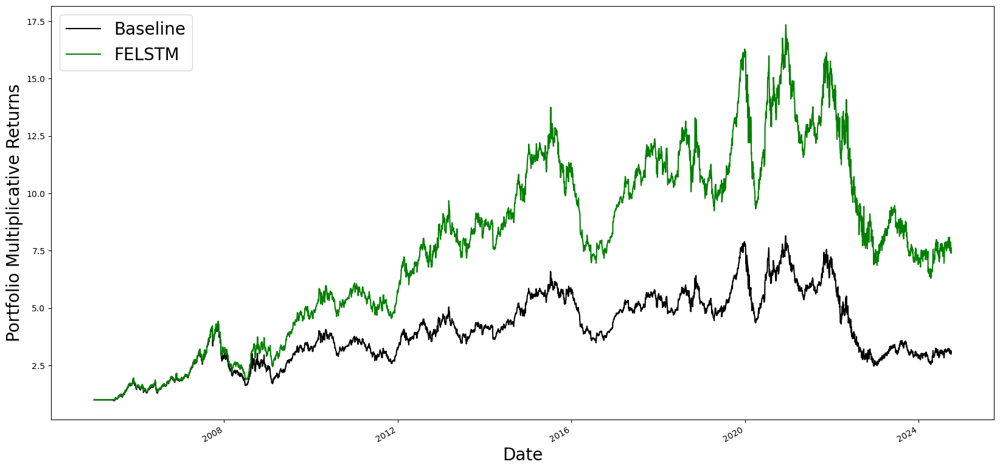

In [62]:
# Plot Multiplicative Returns
plt.figure(figsize = (20,10))
df_actual['Returns'].plot(color = 'k', label= 'Baseline')
df_pred['Returns'].plot(color = 'g', label= 'FELSTM')
plt.legend(loc=2, fontsize=20)
plt.ylabel('Portfolio Multiplicative Returns', size=20)
plt.xlabel('Date', size=20)
plt.savefig("returns_final_plot.png", bbox_inches='tight')
plt.show()

# Benchmark method

In [102]:
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [116]:
svr = SVR(kernel='rbf', C=100, gamma = 1, epsilon=0.01)

# Train the model
svr.fit(X_train, y_train.ravel())

SVR(C=100, epsilon=0.01, gamma=1)

In [117]:
y_pred_SVR = svr.predict(X_test)
y_pred_SVR_train = svr.predict(X_train)
y_pred_SVR_val = svr.predict(X_val)

# Evaluate performance
mse = mean_squared_error(y_test.numpy(), y_pred_SVR)
# mae = mean_absolute_error(Y_test_original, Y_pred_original)

print(f"SVR Test RMSE: {np.sqrt(mse):.6f}")
# print(f"SVR Test MAE: {mae:.6f}")

SVR Test RMSE: 0.018606


In [118]:
actual_predicted_prices_svr = transform_to_actual_prices(y_pred_SVR.squeeze(), test_reference_prices)
actual_predicted_train_svr = transform_to_actual_prices(y_pred_SVR_train.squeeze(), train_reference_prices)
actual_predicted_val_svr = transform_to_actual_prices(y_pred_SVR_val.squeeze(), val_referece_prices)

In [119]:
x = np.reshape(actual_actual_prices, [-1, 1])
px = np.reshape(actual_predicted_prices_svr, [-1, 1])

In [120]:
mse = ((px-x)**2).mean()
rmse = np.sqrt(mse)
print("RMSE:", rmse)

RMSE: 3.076559888939961


In [121]:
predicted_svr_comb = np.concatenate((actual_predicted_train_svr, actual_predicted_val_svr, actual_predicted_prices_svr))

In [125]:
df_pred_SVR = pd.DataFrame(predicted_svr_comb, index=index_labels, columns=['Close'])
compute_trade_signals_predicted(df_pred_SVR)
df_pred_SVR = computereturns(df_pred_SVR,0.005)

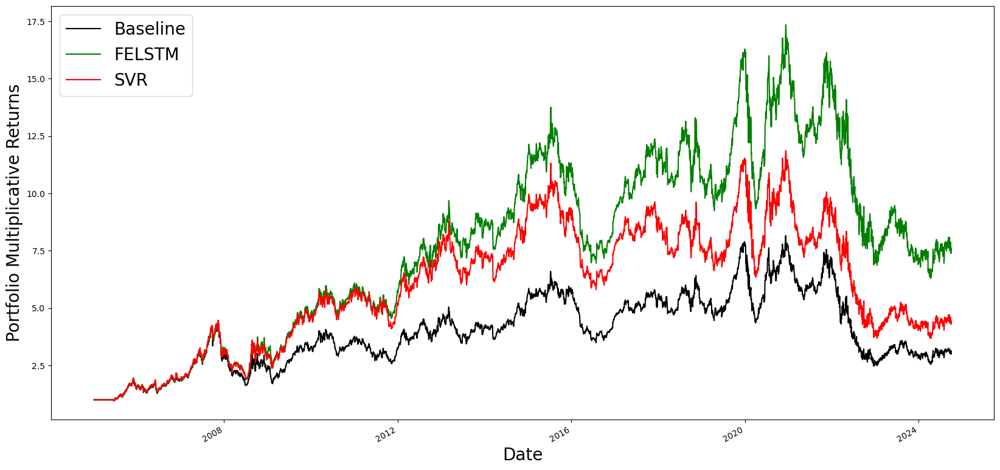

In [126]:
plt.figure(figsize = (20,10))
df_actual['Returns'].plot(color = 'k', label= 'Baseline')
df_pred['Returns'].plot(color = 'g', label= 'FELSTM')
df_pred_SVR['Returns'].plot(color = 'r', label= 'SVR')
plt.legend(loc=2, fontsize=20)
plt.ylabel('Portfolio Multiplicative Returns', size=20)
plt.xlabel('Date', size=20)
plt.savefig("returns_final_plot_three.png", bbox_inches='tight')
plt.show()

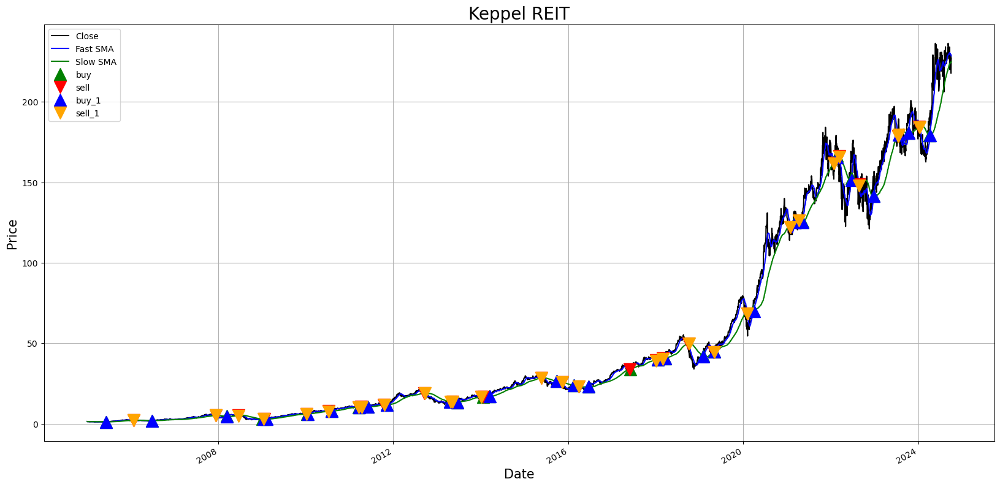

In [129]:
def plotprice_final(df, df1):
  plt.figure(figsize = (20,10))
  df['Close'].plot(color = 'k', label= 'Close')
  df['FMA'].plot(color = 'b', label = 'Fast SMA')
  df['SMA'].plot(color = 'g', label = 'Slow SMA')
  # df1['Close'].plot(color = 'k', label= 'Close')
  # df1['FMA'].plot(color = 'b', label = 'Fast SMA')
  # df1['SMA'].plot(color = 'g', label = 'Slow SMA')
  # plot buy signals
  plt.plot(df[df['Position'] == 1].index, df['FMA'][df['Position'] == 1], '^', markersize = 15, color = 'g', label = 'buy')
  # plot sell signals
  plt.plot(df[df['Position'] == -1].index, df['FMA'][df['Position'] == -1], 'v', markersize = 15, color = 'r', label = 'sell')
    # plot buy signals
  plt.plot(df1[df1['Position'] == 1].index, df1['FMA'][df1['Position'] == 1], '^', markersize = 15, color = 'blue', label = 'buy_1')
  # plot sell signals
  plt.plot(df1[df1['Position'] == -1].index, df1['FMA'][df1['Position'] == -1], 'v', markersize = 15, color = 'orange', label = 'sell_1')
    
  plt.ylabel('Price', fontsize = 15 )
  plt.xlabel('Date', fontsize = 15 )
  plt.title('Keppel REIT', fontsize = 20)
  plt.legend()
  plt.grid()
  plt.savefig("price_final.png", bbox_inches='tight')
  plt.show()

plotprice_final(df_actual, df_pred)

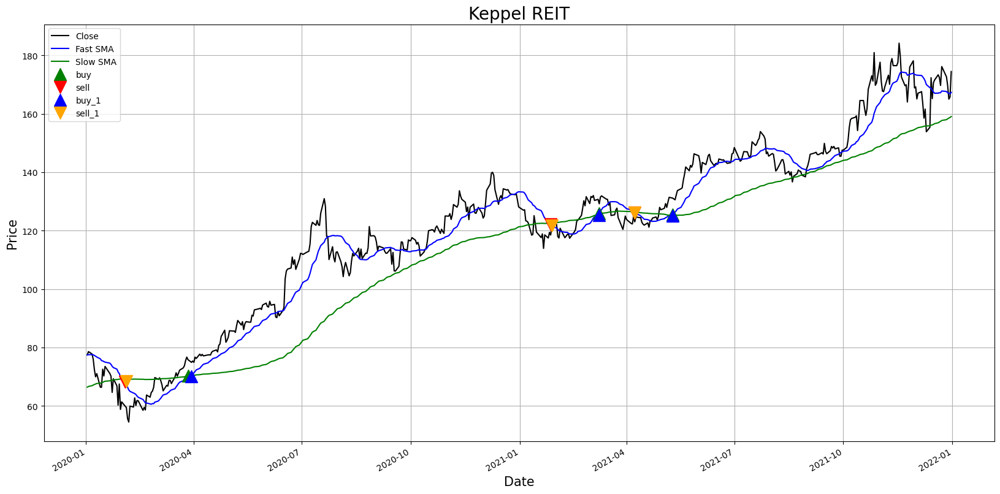

In [132]:
sdf_1=df_actual.loc['2020-01-01':'2021-12-31']
sdf_2 = df_pred.loc['2020-01-01':'2021-12-31']
plotprice_final(sdf_1, sdf_2)

In [140]:
def plotprice(df):
  plt.figure(figsize = (20,10))
  df['Close'].plot(color = 'k', label= 'Close')
  df['FMA'].plot(color = 'b', label = 'Fast SMA')
  df['SMA'].plot(color = 'g', label = 'Slow SMA')
  # plot buy signals
  plt.plot(df[df['Position'] == 1].index, df['FMA'][df['Position'] == 1], '^', markersize = 15, color = 'g', label = 'buy')
  # plot sell signals
  plt.plot(df[df['Position'] == -1].index, df['FMA'][df['Position'] == -1], 'v', markersize = 15, color = 'r', label = 'sell')
  plt.ylabel('Price', fontsize = 15 )
  plt.xlabel('Date', fontsize = 15 )
  plt.title('Apple', fontsize = 20)
  plt.legend()
  plt.grid()
  plt.savefig("moving_avg_1111.png", bbox_inches='tight')
  plt.show()

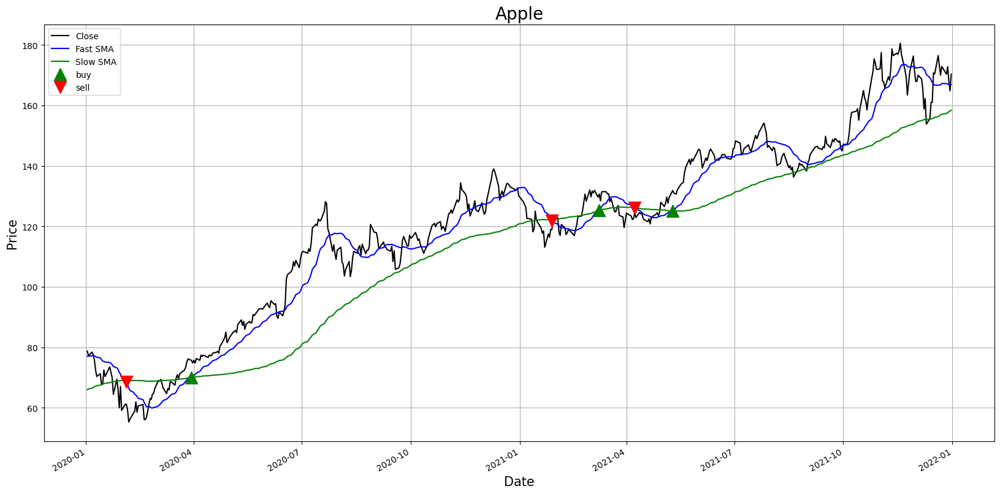

In [141]:
plotprice(sdf_2)

# Transfer learning

In [142]:
import copy

# Create a deep copy of the trained model
new_model = copy.deepcopy(trained_model)

In [143]:
for param in new_model.condition_layer.parameters():
    param.requires_grad = False  # Freeze condition layer (DIC-based fuzzification)

for param in new_model.hidden_layer.lstm.parameters():
    param.requires_grad = False  # Freeze LSTM in the hidden layer

In [144]:
ticker = yf.Ticker('MSFT')
# ticker = yf.Ticker('MSFT')
stock_df = ticker.history(period="max")
lookback_window = 25
reference_point_shift = 7
train_ratio=0.7
val_ratio=0.15
# stock_df = stock_df.loc[stock_df.index >= "2005-01-01"]
stock_df = stock_df[stock_df.index >= "2005-01-01"]

prices = stock_df['Close'].values
data_length = len(prices)

# Transform into relative prices
relative_prices = []
for t in range(reference_point_shift, data_length - lookback_window):
    ref_price = prices[t - reference_point_shift]  # Reference price
    window_prices = prices[t:t + lookback_window]  # Prices in the current window
    rel_prices = ((window_prices - ref_price) / ref_price)  #* 100  # Relative price transformation
    relative_prices.append(rel_prices)

# Convert to numpy array
relative_prices = np.array(relative_prices)

# Create inputs (X) and targets (y)
X = relative_prices[:, :-1]  # All but the last step in the window as input
y = relative_prices[:, -1]  # Last step in the window as target

# Sequential Split
num_samples = len(X)
train_end = int(train_ratio * num_samples)
val_end = int((train_ratio + val_ratio) * num_samples)

X_train, X_val, X_test = X[:train_end], X[train_end:val_end], X[val_end:]
y_train, y_val, y_test = y[:train_end], y[train_end:val_end], y[val_end:]

# Convert to PyTorch tensors
X_train_msft = torch.tensor(X_train, dtype=torch.float32)
X_val_msft = torch.tensor(X_val, dtype=torch.float32)
X_test_msft = torch.tensor(X_test, dtype=torch.float32)

y_train_msft = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)  # Add output dimension
y_val_msft = torch.tensor(y_val, dtype=torch.float32).unsqueeze(1)
y_test_msft = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)

In [145]:
print("Training Input Shape:", X_train_msft.shape)
print("Validation Input Shape:", X_val_msft.shape)
print("Testing Input Shape:", X_test_msft.shape)
print("Training Target Shape:", y_train_msft.shape)
print("Validation Target Shape:", y_val_msft.shape)
print("Testing Target Shape:", y_test_msft.shape)

Training Input Shape: torch.Size([3479, 24])
Validation Input Shape: torch.Size([746, 24])
Testing Input Shape: torch.Size([746, 24])
Training Target Shape: torch.Size([3479, 1])
Validation Target Shape: torch.Size([746, 1])
Testing Target Shape: torch.Size([746, 1])


In [146]:
trained_model = train_model(
    new_model,  # Use the pre-trained model
    X_train_msft,
    y_train_msft,
    X_val_msft,
    y_val_msft,
    epochs=50,  # Fewer epochs, as the model is already trained
    batch_size=32,
    learning_rate=1e-4  # Use a smaller learning rate to avoid overwriting learned weights
)

Epoch 1/50 - Loss: 0.000009, Val Loss: 0.000357
Epoch 2/50 - Loss: 0.000009, Val Loss: 0.000355
Epoch 3/50 - Loss: 0.000009, Val Loss: 0.000354
Epoch 4/50 - Loss: 0.000009, Val Loss: 0.000354
Epoch 5/50 - Loss: 0.000009, Val Loss: 0.000354
Epoch 6/50 - Loss: 0.000009, Val Loss: 0.000353
Epoch 7/50 - Loss: 0.000009, Val Loss: 0.000353
Epoch 8/50 - Loss: 0.000009, Val Loss: 0.000353
Epoch 9/50 - Loss: 0.000009, Val Loss: 0.000353
Epoch 10/50 - Loss: 0.000009, Val Loss: 0.000353
Epoch 11/50 - Loss: 0.000009, Val Loss: 0.000353
Epoch 12/50 - Loss: 0.000008, Val Loss: 0.000353
Epoch 13/50 - Loss: 0.000008, Val Loss: 0.000354
Epoch 14/50 - Loss: 0.000008, Val Loss: 0.000354
Epoch 15/50 - Loss: 0.000008, Val Loss: 0.000354
Epoch 16/50 - Loss: 0.000008, Val Loss: 0.000354
Epoch 17/50 - Loss: 0.000008, Val Loss: 0.000354
Epoch 18/50 - Loss: 0.000008, Val Loss: 0.000354
Epoch 19/50 - Loss: 0.000008, Val Loss: 0.000354
Epoch 20/50 - Loss: 0.000008, Val Loss: 0.000354
Epoch 21/50 - Loss: 0.000008,

In [178]:
test_predictions_msft = predict(trained_model, X_test_msft)

# Calculate RMSE for the test set
test_rmse_msft = mean_squared_error(y_test_msft.numpy(), test_predictions_msft, squared=False)
print(f"Test RMSE: {test_rmse_msft:.4f}")

# Display the predicted prices
print("Test Predicted Prices:", test_predictions_msft[-10:])

Test RMSE: 0.0177
Test Predicted Prices: [[-0.07196166]
 [-0.05628245]
 [-0.05536445]
 [-0.04162516]
 [-0.02740752]
 [-0.01200192]
 [-0.012833  ]
 [-0.02369388]
 [ 0.00511946]
 [ 0.01695446]]


In [179]:
test_reference_prices_msft = stock_df['Close'].iloc[-len(y_test) - 24 - 7: - 24 - 7].values
actual_predicted_prices_msft = transform_to_actual_prices(test_predictions_msft.squeeze(), test_reference_prices_msft)

actual_actual_prices_msft = transform_to_actual_prices(y_test_msft.numpy().flatten(), test_reference_prices_msft)

In [180]:
actual_price_msft_ok = np.reshape(stock_df['Close'].iloc[-len(test_reference_prices_msft):].values, [-1,1])

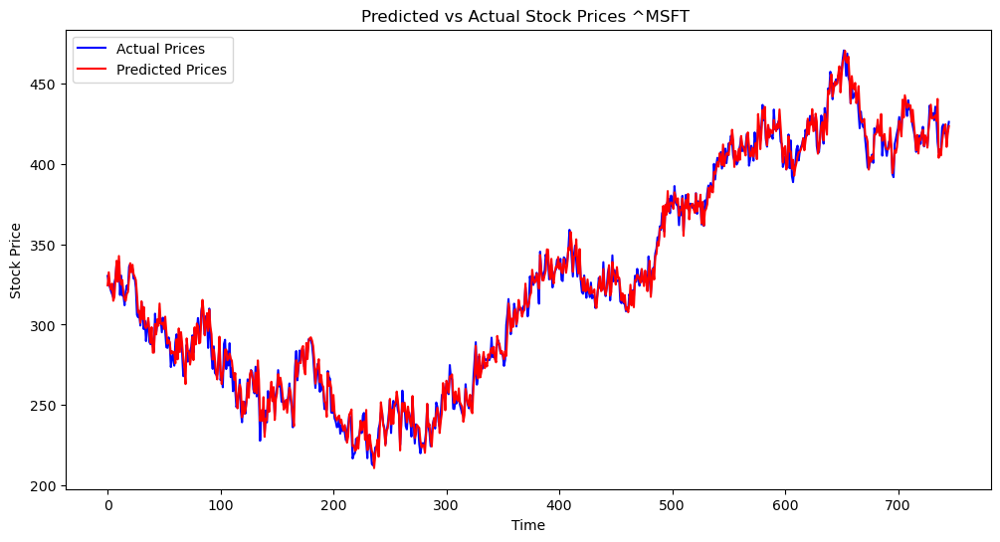

In [181]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(actual_actual_prices_msft, label="Actual Prices", color='blue')
# plt.plot(actual_price_msft_ok, label="Actual Prices", color='blue')
plt.plot(actual_predicted_prices_msft, label="Predicted Prices", color='red')
plt.title("Predicted vs Actual Stock Prices ^MSFT ")
plt.xlabel("Time")
plt.ylabel("Stock Price")
plt.legend()
plt.show()

In [151]:
x_msft = np.reshape(actual_actual_prices_msft, [-1, 1])
px_msft = np.reshape(actual_predicted_prices_msft, [-1, 1])

In [152]:
mse = ((px_msft-x_msft)**2).mean()
rmse = np.sqrt(mse)
print("RMSE:", rmse)

RMSE: 5.352482080417707


In [153]:
rw_x_msft = np.reshape(stock_df['Close'].iloc[-len(y_test_msft):].values, [-1,1])

In [154]:
mse = ((rw_x_msft-x_msft)**2).mean()
rmse = np.sqrt(mse)
print("Random Walk RMSE:", rmse)

Random Walk RMSE: 7.253463528207453


In [155]:
predicted_msft = actual_predicted_prices_msft
actual_msft = actual_actual_prices_msft

In [156]:
y_pred_SVR_msft = svr.predict(X_test_msft)

In [157]:
actual_predicted_prices_svr_msft = transform_to_actual_prices(y_pred_SVR_msft.squeeze(), test_reference_prices_msft)

In [158]:
x = np.reshape(actual_actual_prices_msft, [-1, 1])
px = np.reshape(actual_predicted_prices_svr_msft, [-1, 1])

In [159]:
mse = ((px-x)**2).mean()
rmse = np.sqrt(mse)
print("RMSE:", rmse)

RMSE: 5.557872469011868


In [192]:
train_predictions_msft = predict(trained_model, X_train_msft)
val_predictions_msft = predict(trained_model, X_val_msft)

train_reference_prices_msft = stock_df['Close'].iloc[:train_end].values
val_referece_prices_msft = stock_df['Close'].iloc[train_end:val_end].values

actual_train_predicted_prices_msft = transform_to_actual_prices(train_predictions_msft.squeeze(), train_reference_prices_msft)
actual_val_predicted_prices_msft = transform_to_actual_prices(val_predictions_msft.squeeze(), val_referece_prices_msft)

In [193]:
actual_actual_prices_msft = transform_to_actual_prices(y_test_msft.numpy().flatten(), test_reference_prices_msft)
actual_train_prices_msft = transform_to_actual_prices(y_train_msft.numpy().flatten(), train_reference_prices_msft)
actual_val_prices_msft = transform_to_actual_prices(y_val_msft.numpy().flatten(), val_referece_prices_msft)

In [194]:
predicted_msft = np.concatenate((actual_train_predicted_prices_msft, actual_val_predicted_prices_msft, actual_predicted_prices_msft))
actual_msft = np.concatenate((actual_train_prices_msft, actual_val_prices_msft, actual_actual_prices_msft))

In [195]:
y_pred_SVR_msft = svr.predict(X_test_msft)
y_pred_SVR_train_msft = svr.predict(X_train_msft)
y_pred_SVR_val_msft = svr.predict(X_val_msft)

In [196]:
actual_predicted_prices_svr_msft = transform_to_actual_prices(y_pred_SVR_msft.squeeze(), test_reference_prices_msft)
actual_predicted_train_svr_msft = transform_to_actual_prices(y_pred_SVR_train_msft.squeeze(), train_reference_prices_msft)
actual_predicted_val_svr_msft = transform_to_actual_prices(y_pred_SVR_val_msft.squeeze(), val_referece_prices_msft)

In [197]:
actual_predicted_prices_svr_msft = np.concatenate((actual_predicted_train_svr_msft, actual_predicted_val_svr_msft, actual_predicted_prices_svr_msft))

In [198]:
index_labels_msft = stock_df.index.array[-len(predicted_msft):]
df_pred_msft = pd.DataFrame(predicted_msft, index=index_labels_msft, columns=['Close'])
df_actual_msft = pd.DataFrame(actual_msft, index=index_labels_msft, columns=['Close'])
df_pred_SVR_msft = pd.DataFrame(actual_predicted_prices_svr_msft, index=index_labels_msft, columns=['Close'])

In [199]:
compute_trade_signals_predicted(df_pred_msft)
compute_trade_signals_predicted(df_pred_SVR_msft)
compute_trade_signals(df_actual_msft)

In [200]:
df_pred_msft = computereturns(df_pred_msft,0.005)
df_pred_SVR_msft = computereturns(df_pred_SVR_msft,0.005)
df_actual_msft = computereturns(df_actual_msft,0.005)

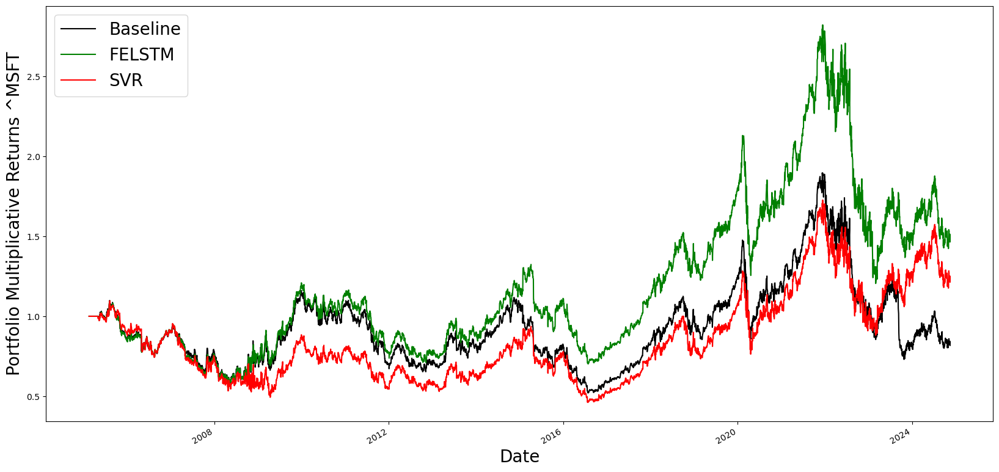

In [201]:
plt.figure(figsize = (20,10))
df_actual_msft['Returns'].plot(color = 'k', label= 'Baseline')
df_pred_msft['Returns'].plot(color = 'g', label= 'FELSTM')
df_pred_SVR_msft['Returns'].plot(color = 'r', label= 'SVR')
plt.legend(loc=2, fontsize=20)
plt.ylabel('Portfolio Multiplicative Returns ^MSFT', size=20)
plt.xlabel('Date', size=20)
plt.savefig("returns_final_plot_three_MSFT.png", bbox_inches='tight')
plt.show()